# Preface
In today’s data-driven world, predictive analytics has become a cornerstone of decision-making across industries. In the banking sector, understanding customer behavior is crucial for enhancing services, minimizing risks, and identifying potential opportunities. This project focuses on predicting whether a customer will make a transaction in the future, irrespective of the transaction amount.

The dataset provided comprises 202 columns, including anonymized features and a target variable indicating transaction behavior.Through this project, we aspire to gain deeper insights into customer behavior while developing a robust predictive model that can be applied to real-world scenarios in the banking domain. This preface sets the stage for the systematic exploration and problem-solving approach that follows in this report.

# Problem Statement
- Prepare a complete data analysis report on the given data.

- Create a predictive model which will help the bank to identify which customer will make transactions in future.


# Domain Analysis
- Customer transaction prediction is used to predict whether the customer will make an transaction or not in feature. It is used in banking industry to identify potential customers.
   - Dataset  of consist of 202 columns
   - 1st column is ID_CODE, 2 nd is target column and remaining 200 columns are anonymized features with column name from var_1 to var_200

__1. Id_code:__ Unique identifier for each row or record in the data.

__2. Target:__ 0 means the customer will not do a transaction and 1 means the customer will do a transaction.

# Importing required libraries

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import Parallel, parallel_backend
from sklearn.metrics import accuracy_score,f1_score,precision_score,recall_score,classification_report,confusion_matrix,fbeta_score,roc_curve,auc
import warnings
warnings.filterwarnings("ignore", category=UserWarning)


In [ ]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

# Basic Checks

In [3]:
df=pd.read_csv('customer.csv')

In [49]:
df

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [50]:
df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [54]:
df.tail()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001
199999,train_199999,0,10.8762,-5.7105,12.1183,8.0328,11.5577,0.3488,5.2839,15.2058,...,8.9842,1.6893,0.1276,0.3766,15.2101,-2.4907,-2.2342,8.1857,12.1284,0.1385


In [56]:
df.shape

(200000, 202)

It consists of 200000 rows and 202 columns

In [59]:
df.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


- The dataset has no constant columns, as no feature has zero variance.
- Features are on different scales, indicating that normalization or standardization might be required before modeling.
- In some features there high difference between 75th percentile and Max value, we need to handle outliers

In [62]:
df.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 202 columns):
 #    Column   Non-Null Count   Dtype  
---   ------   --------------   -----  
 0    ID_code  200000 non-null  object 
 1    target   200000 non-null  int64  
 2    var_0    200000 non-null  float64
 3    var_1    200000 non-null  float64
 4    var_2    200000 non-null  float64
 5    var_3    200000 non-null  float64
 6    var_4    200000 non-null  float64
 7    var_5    200000 non-null  float64
 8    var_6    200000 non-null  float64
 9    var_7    200000 non-null  float64
 10   var_8    200000 non-null  float64
 11   var_9    200000 non-null  float64
 12   var_10   200000 non-null  float64
 13   var_11   200000 non-null  float64
 14   var_12   200000 non-null  float64
 15   var_13   200000 non-null  float64
 16   var_14   200000 non-null  float64
 17   var_15   200000 non-null  float64
 18   var_16   200000 non-null  float64
 19   var_17   200000 non-null  float64
 20   va

- It has 202 columns
- There are 1 object column, 1 integer column and 200 float columns


In [65]:
df[df.duplicated()]

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199


There is no duplicate column

In [68]:
df.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

There is no null values

# Exploratory Data Analysis


- We could not perform complete data analysis because as feature names are not provided.
- we can plot the distibution of the feature

CHECKING DISTRIBUTION OF FIRST 100 FEATURE

In [27]:
df_100=df.iloc[:,2:102]
count=1

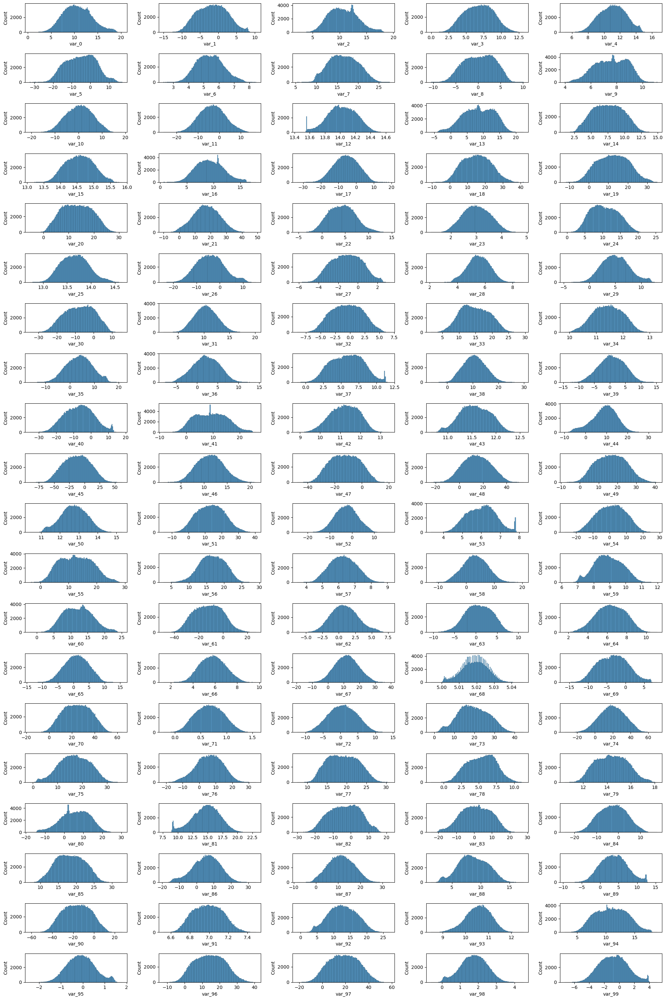

In [29]:
plt.figure(figsize=(20, 30))
count = 1
for column in df_100.columns:
    if count > 100:
        break
    plt.subplot(20, 5, count)
    sns.axisgrid
    sns.histplot(df_100[column])
    count += 1
plt.tight_layout()
plt.show()


CHECKING DISTRIBUTION OF NEXT 100 FEATURE

In [ ]:
df_200=df.iloc[:,103:202]
count=1

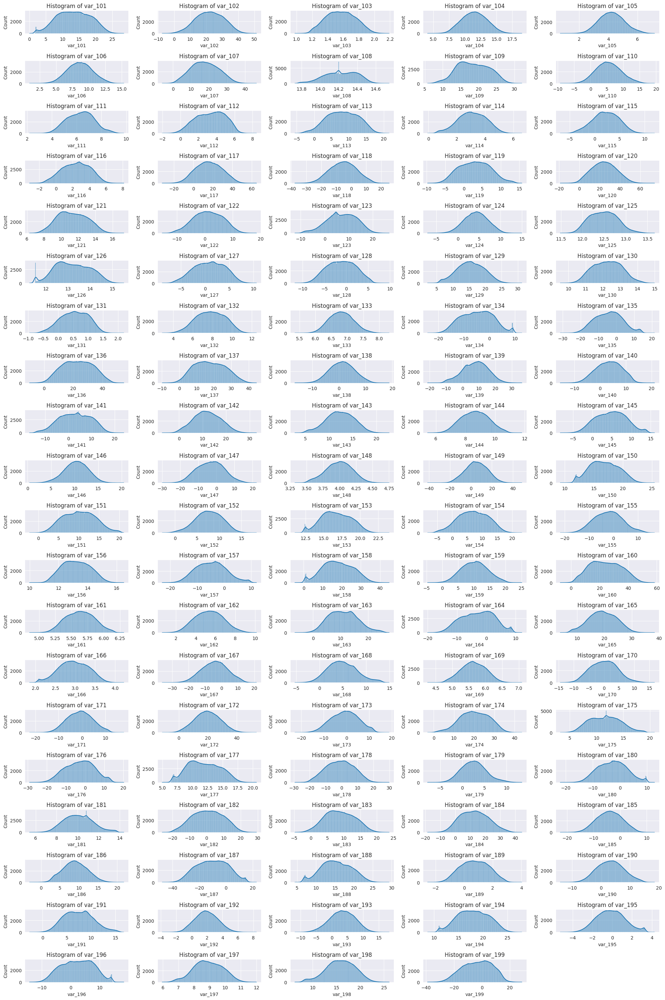

In [ ]:
plt.figure(figsize=(20, 30))
count = 1
for column in df_200.columns:
    if count > 100:
        break
    ax=plt.subplot(20, 5, count)
    sns.histplot(df_200[column],kde=True,ax=ax)
    count += 1
    sns.set_style('darkgrid')
    ax.set_title(f'Histogram of {column}')
plt.tight_layout()
plt.show()


Most of the features follow normal distribution or close to normal distribution we don't need to perform transformation technique

# Data Preprocessing

## 1. Checking Null Values

In [64]:
df.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

There is no values in the data set

## 2. Handling Outliers

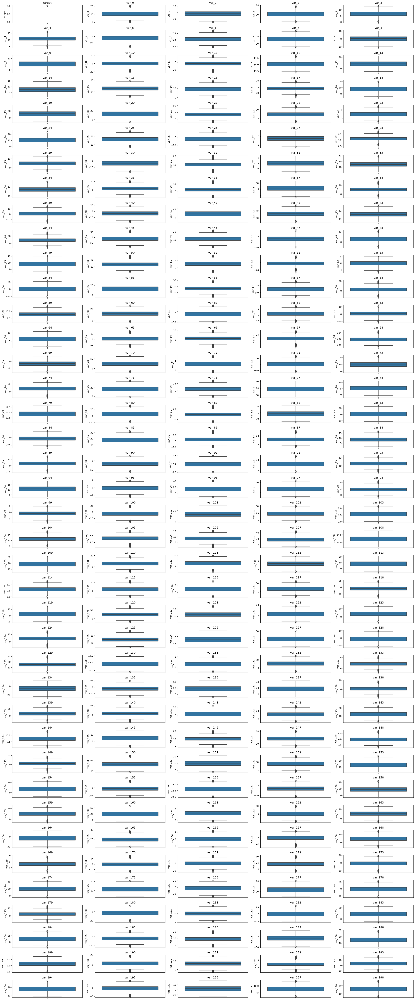

In [7]:
plt.figure(figsize=(25, 60))
for i, column in enumerate(df.select_dtypes(include=[np.number]).columns):
    if i >=200:
        break
    plt.subplot(40, 5, i+1)  # Adjust subplot size for many columns
    sns.boxplot(df[column])
    plt.title(column)
plt.tight_layout()
plt.show()


From boxplot we found that most of the features have outliers, so we need to impute.

In [88]:
data2=df.copy()

### winsorization

In [80]:
df['var_0'].describe()

count    200000.000000
mean         10.679914
std           3.040051
min           0.408400
25%           8.453850
50%          10.524750
75%          12.758200
max          20.315000
Name: var_0, dtype: float64

In [82]:
numerical_columns=df.drop(['target','ID_code'],axis=1).columns

In [84]:
from scipy.stats.mstats import winsorize

In [90]:
for i in numerical_columns:
   data2[i]=winsorize(data2[i],limits=[0.01, 0.01])

In [92]:
data2.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.682792,-1.623615,10.717214,6.796646,11.080435,-5.061810,5.409585,16.543433,0.285386,...,3.239055,7.440018,1.927585,3.332319,17.989343,-0.139602,2.310704,8.907604,15.867157,-3.323791
std,0.300653,3.013680,4.021971,2.619436,2.023476,1.609040,7.804071,0.858006,3.390782,3.305824,...,4.513069,2.996078,1.455871,3.941130,3.116569,1.418458,5.427355,0.913094,2.985400,10.339289
min,0.000000,4.424800,-9.883600,5.456700,2.515900,7.560000,-21.060400,3.600600,9.767000,-6.732500,...,-6.635900,1.338400,-1.246200,-5.986600,11.150200,-3.203200,-8.839800,6.816800,8.562300,-26.192000
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,18.175900,7.541700,17.321000,11.212600,14.484700,12.290500,7.438300,23.892500,6.660100,...,13.525900,14.801100,5.361300,11.922600,24.468600,3.217300,13.905200,10.865100,22.142100,16.539100


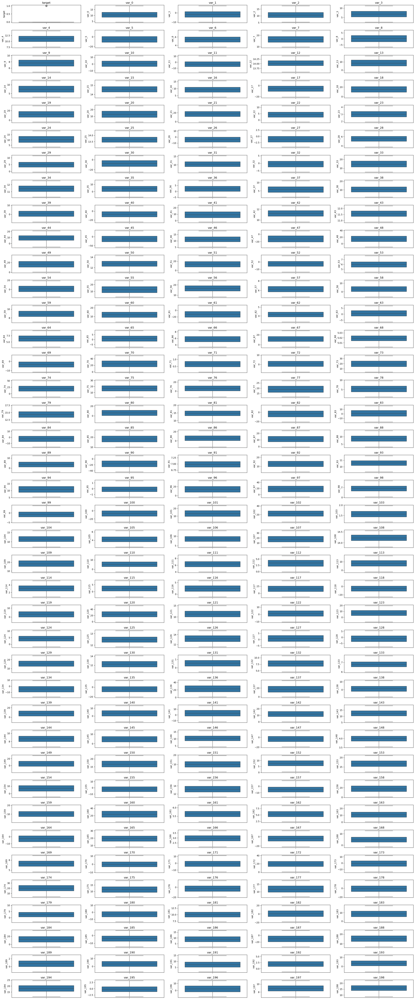

In [94]:
plt.figure(figsize=(25, 60))
for i, column in enumerate(data2.select_dtypes(include=[np.number]).columns,start=1):
  if i>200:
    break
  plt.subplot(40, 5, i)  # Adjust subplot size for many columns
  sns.boxplot(data2[column])
  plt.title(column)
plt.tight_layout()
plt.show()

Outliers has been capped using winsorization

In [96]:
for i in numerical_columns:
   df[i]=winsorize(df[i],limits=[0.01, 0.01])

### Feature Scaling

In [98]:
from sklearn.preprocessing import StandardScaler 
stan_scaler=StandardScaler()

In [100]:
stan_scaled=stan_scaler.fit_transform(df.iloc[:,2:])

In [102]:
df.iloc[:,2:]=stan_scaled

### Handling Imbalance

<Axes: ylabel='count'>

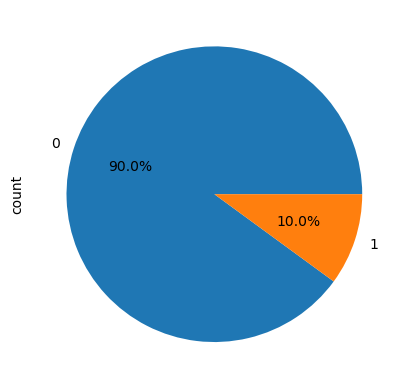

In [104]:
df['target'].value_counts().plot(kind='pie', autopct='%1.1f%%')

In [106]:
count=df['target'].value_counts()
count

target
0    179902
1     20098
Name: count, dtype: int64

<Axes: xlabel='target', ylabel='count'>

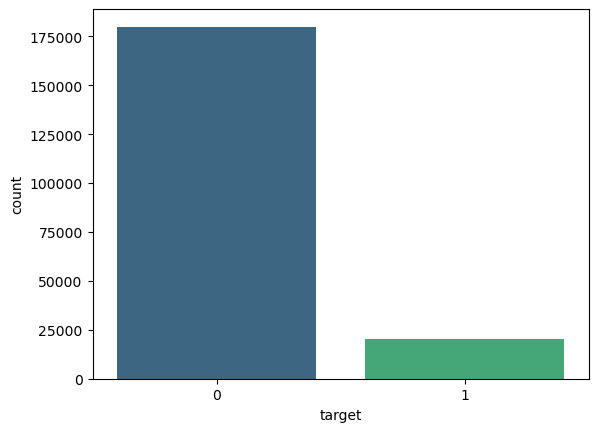

In [108]:
sns.countplot(x='target', data=df, palette='viridis')

Observation
- we found that there is huge imbalance in target column
- target 1 is 10% and target 0 is 90%

In [111]:
data2=df.copy()

In [113]:
from imblearn.over_sampling import SMOTE

In [115]:
df.drop(['ID_code'],axis=1,inplace=True)

In [117]:
x_df=df.iloc[:,1:]
y_df=df.iloc[:,0]

In [119]:
smote = SMOTE(random_state=42)
x_df,y_df=smote.fit_resample(x_df,y_df)

In [123]:
x_df

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-0.583107,-1.283624,0.454636,-0.841942,0.236331,-0.540949,-0.339025,0.614363,-1.574615,-1.483813,...,0.265085,-1.160125,0.830306,-0.416460,0.171136,-1.592012,1.025861,-0.376856,-1.033987,0.215914
1,0.271366,-0.627476,1.199340,-0.695659,0.796604,1.551131,0.246170,-0.002841,0.865570,0.422267,...,0.975623,0.093917,0.450669,1.933278,-0.821047,1.532303,1.071610,-0.130003,0.833674,0.510248
2,-0.688028,-0.278989,0.520451,0.541720,-0.309462,-0.515359,1.786839,-0.568582,-1.574403,-1.316284,...,-0.073865,0.784522,-0.176654,-0.417779,1.159886,2.313293,-1.627317,-0.701030,-0.383520,0.359822
3,0.125298,-0.131325,-0.673816,0.197213,0.934824,0.413338,0.504910,-0.477305,-1.859235,0.552622,...,0.271999,-0.900085,-0.830972,-0.484867,1.618886,-0.797345,-0.965151,1.516382,0.704277,-0.548957
4,-0.280685,0.034862,0.823609,-0.078650,0.743778,0.962373,0.618779,0.798628,1.808938,0.090715,...,-1.047971,0.694704,-1.427593,1.487364,-1.508632,-0.967600,0.297751,0.652175,0.713555,-0.530658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359799,1.180100,0.303662,0.060679,1.624242,-0.605436,0.912215,0.280194,0.706491,0.040917,0.013313,...,0.718918,-0.574796,-0.756408,1.185367,-0.321401,-0.030911,1.345448,0.003177,0.238676,0.112598
359800,-1.101831,-0.846250,-0.481916,0.634621,-0.339999,-0.095278,1.835382,-0.060322,-0.859849,0.471204,...,-0.503018,-0.730951,0.586539,-0.881014,0.155351,-0.595696,0.999919,0.745172,1.454608,0.638863
359801,-0.549141,0.110540,0.030786,0.609230,0.006736,-0.062077,2.160675,1.271892,-0.024606,0.356147,...,-0.416337,0.414702,0.089051,-0.050646,0.932746,0.681492,0.243928,0.070278,-0.816494,1.255509
359802,-0.459274,-0.725759,-0.399138,0.165232,-0.873341,-0.473898,0.276801,0.317458,-0.015853,-1.068142,...,1.562618,-0.047563,0.877618,1.395044,-0.007773,-1.879111,1.199116,-0.489416,-0.320432,-0.867017


### Feature Selection

In [125]:
corr_matrix_1=x_df.corr()

In [127]:
plt.figure(figsize=(120,120))
sns.heatmap(corr_matrix_1,annot=True,cmap='Blues')

<Axes: >

Observation:
- we can't interpret the heatmap we create a loop to find the feature which has high correlation within the features 

In [132]:
threshold=0.90
high_corr_pairs = []
for i in range(len(corr_matrix_1.columns)):
    for j in range(i):
        if abs(corr_matrix_1.iloc[i,j])>threshold:
            feature_1=corr_matrix_1.columns[i]
            feature_2=corr_matrix_1.columns[j]
            corr_value=corr_matrix_1.iloc[i, j]
            high_corr_pairs.append([feature_1, feature_2, corr_value])
high_corr_df = pd.DataFrame(high_corr_pairs, columns=["Feature 1", "Feature 2", "Correlation"])

high_corr_df

,Feature 1,Feature 2,Correlation


Observation
- Their is no highly correlated feature in dataset

In [135]:
x_df.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-0.583107,-1.283624,0.454636,-0.841942,0.236331,-0.540949,-0.339025,0.614363,-1.574615,-1.483813,...,0.265085,-1.160125,0.830306,-0.416460,0.171136,-1.592012,1.025861,-0.376856,-1.033987,0.215914
1,0.271366,-0.627476,1.199340,-0.695659,0.796604,1.551131,0.246170,-0.002841,0.865570,0.422267,...,0.975623,0.093917,0.450669,1.933278,-0.821047,1.532303,1.071610,-0.130003,0.833674,0.510248
2,-0.688028,-0.278989,0.520451,0.541720,-0.309462,-0.515359,1.786839,-0.568582,-1.574403,-1.316284,...,-0.073865,0.784522,-0.176654,-0.417779,1.159886,2.313293,-1.627317,-0.701030,-0.383520,0.359822
3,0.125298,-0.131325,-0.673816,0.197213,0.934824,0.413338,0.504910,-0.477305,-1.859235,0.552622,...,0.271999,-0.900085,-0.830972,-0.484867,1.618886,-0.797345,-0.965151,1.516382,0.704277,-0.548957
4,-0.280685,0.034862,0.823609,-0.078650,0.743778,0.962373,0.618779,0.798628,1.808938,0.090715,...,-1.047971,0.694704,-1.427593,1.487364,-1.508632,-0.967600,0.297751,0.652175,0.713555,-0.530658


## Principal Component Analysis
- Principal Component Analysis (PCA) is a dimensionality reduction technique used in machine learning and statistics to reduce the number of features in a dataset while preserving as much variability (information) as possible.

In [139]:
from sklearn.decomposition import PCA
pca=PCA()

In [141]:
pca.fit_transform(x_df)

array([[ 0.89354824,  0.75931653, -0.25684818, ...,  0.96828905,
        -1.21192627,  0.82615342],
       [-1.28656727,  0.6258994 , -1.28947956, ...,  0.16071083,
        -0.35429909, -0.13098262],
       [ 0.68341901, -0.7596466 , -0.16179169, ..., -0.10764453,
        -0.53643116,  0.36891169],
       ...,
       [-1.25179045, -0.21378531, -0.76444137, ..., -0.66135823,
         0.85897979, -0.01044402],
       [-0.79287981,  0.39358926, -0.75607198, ...,  0.37617681,
        -0.07600034,  0.02023365],
       [-0.73964836,  0.5005119 ,  0.29843679, ..., -0.50634504,
        -0.05618156, -1.02985775]])

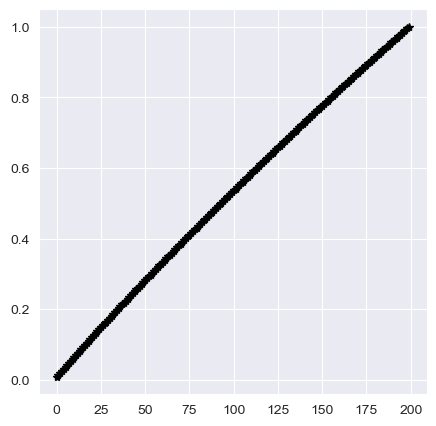

In [143]:
plt.figure(figsize=(5,5))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),c='black',marker='*')

In [145]:
value=np.cumsum(pca.explained_variance_ratio_)>=0.9
n_components=np.argmax(value)+1
n_components

178

Observation
- We use PCA n_compoenents =178 because it captures 90% variance of the dataset 

In [148]:
pca_178=PCA(n_components=178)

In [150]:
x_df=pca_178.fit_transform(x_df)

In [152]:
x_df=pd.DataFrame(x_df,columns=['pca{}'.format(i)  for i in range(1,179)])

In [154]:
x_df

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca169,pca170,pca171,pca172,pca173,pca174,pca175,pca176,pca177,pca178
0,0.893548,0.759317,-0.256848,0.002169,-0.377077,-0.849089,0.638820,0.056955,2.274681,-1.468735,...,-2.298904,-2.412847,-0.376217,-0.009549,0.147503,-0.952024,-1.049453,-0.185748,-0.317859,0.243916
1,-1.286567,0.625899,-1.289480,-0.653027,1.310267,-3.550276,-0.353874,1.180079,-1.601323,2.078866,...,-0.628357,0.716788,-2.337639,0.118245,0.535476,0.095553,1.128172,1.102466,0.699375,0.329027
2,0.683419,-0.759647,-0.161792,-1.189379,1.283509,1.054505,-0.700373,-0.027732,0.936308,-1.113673,...,-0.565361,1.533175,0.695999,1.413479,0.227024,0.326335,0.861973,-0.044796,1.259777,-0.762971
3,-0.881155,-1.272226,-0.614516,0.548973,1.246210,0.772540,-0.137911,-0.146925,-0.626287,-1.872724,...,-0.625019,0.382674,1.373001,2.177344,-1.402941,0.405241,-1.173253,-0.466720,-1.784271,-0.312594
4,-0.110871,1.002940,0.070115,0.029388,-0.540066,0.189034,0.885468,-0.517085,-0.036951,0.317051,...,0.014773,0.701991,1.413124,0.314623,1.505328,-0.068890,0.570512,2.177443,-1.317276,-0.351444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359799,-1.808358,-0.205613,0.166935,0.889050,1.061636,-0.230328,1.676622,1.156478,0.125923,1.218695,...,-0.850678,-0.199722,-0.190046,-0.420908,-1.899579,-0.884860,0.163594,-0.060295,1.058056,0.201320
359800,-0.594729,0.659484,0.593067,-0.518798,-0.772385,-0.055980,2.051254,-1.311701,-1.173033,-0.566100,...,-0.606921,-0.846580,0.573527,2.489975,-0.295953,-1.408586,-0.262603,-0.981827,1.361551,1.050048
359801,-1.251790,-0.213785,-0.764441,-0.135386,-0.190427,-0.326813,1.395423,-0.820181,0.969238,-0.557825,...,0.803363,-0.156461,0.058311,-0.580850,0.341084,-0.617967,0.442856,-0.352925,0.474638,-0.636536
359802,-0.792880,0.393589,-0.756072,-0.443988,-1.296002,-1.503899,-0.366399,-0.394622,0.911013,0.389992,...,0.434815,-1.143976,-0.311124,-1.028691,-0.127603,-0.023899,0.133504,0.294340,0.069928,0.906560


# Model Creation

In [156]:
x_train_df,x_test_df,y_train_df,y_test_df=train_test_split(x_df,y_df,test_size=0.20,random_state=42)

## Model Evaluation function

### For Displaying the algorithm results

In [160]:
def evaluate_model_performance_display(model, X_train, y_train, X_test, y_test):
  

    # --- Training Data Evaluation ---
    y_train_pred = model.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    
    # ROC Curve for Training Data
    if hasattr(model, "predict_proba"):  # For models that have predict_proba() method
        y_train_probs = model.predict_proba(X_train)[:, 1]
    else:
        y_train_probs = model.decision_function(X_train)  # For models like SVM
    
    fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_probs)
    roc_auc_train = auc(fpr_train, tpr_train)
    
    print(f"Model: {model.__class__.__name__}")
    print("\nTraining Data Evaluation:")
    print(f"Training Accuracy: {train_accuracy:.4f}")
    
    # Plot ROC Curve for Training Data
    plt.figure(figsize=(6, 4))
    plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc_train:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random guess')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate (Recall)')
    plt.title('Receiver Operating Characteristic (ROC) Curve (Training Data)')
    plt.legend(loc='lower right')
    plt.grid()
    plt.tight_layout()  # Adjust layout to fit without scrolling
    plt.show()

    # --- Test Data Evaluation ---
    y_test_pred = model.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_recall = classification_report(y_test, y_test_pred, output_dict=True)['1']['recall']
    test_f2_score = fbeta_score(y_test, y_test_pred, beta=2, average='macro')
    test_report = classification_report(y_test, y_test_pred)
    test_conf_matrix = confusion_matrix(y_test, y_test_pred)
    
    print("\nTest Data Evaluation:")
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print(f"Recall (Test Data): {test_recall:.4f}")
    print(f"F2 Score: {test_f2_score:.4f}")
    print("Classification Report (Test Data):\n", test_report)
    
    # Plot Test Confusion Matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(test_conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix - {model.__class__.__name__} (Test Data)")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()  # Adjust layout to fit without scrolling
    plt.show()

    # ROC Curve for Test Data
    if hasattr(model, "predict_proba"):  # For models that have predict_proba() method
        y_test_probs = model.predict_proba(X_test)[:, 1]
    else:
        y_test_probs = model.decision_function(X_test)  # For models like SVM
    
    fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_probs)
    roc_auc_test = auc(fpr_test, tpr_test)
    
    # Plot ROC Curve for Test Data
    plt.figure(figsize=(6, 4))
    plt.plot(fpr_test, tpr_test, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc_test:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random guess')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate (Recall)')
    plt.title('Receiver Operating Characteristic (ROC) Curve (Test Data)')
    plt.legend(loc='lower right')
    plt.grid()
    plt.tight_layout()  # Adjust layout to fit without scrolling
    plt.show()

### For Creating the data frame

In [163]:
def evaluate_model_performance(model, x_train_df, y_train_df, x_test_df, y_test_df, show_plots=True):
    # Predictions for training data
    y_train_pred = model.predict(x_train_df)
    train_accuracy = accuracy_score(y_train_df, y_train_pred)

    # Probabilities or decision function for training data
    if hasattr(model, "predict_proba"):
        y_train_probs = model.predict_proba(x_train_df)[:, 1]
    else:
        y_train_probs = model.decision_function(x_train_df)

    # Compute ROC AUC for training data
    fpr_train, tpr_train, _ = roc_curve(y_train_df, y_train_probs)
    roc_auc_train = auc(fpr_train, tpr_train)

    # Predictions for testing data
    y_test_pred = model.predict(x_test_df)
    test_accuracy = accuracy_score(y_test_df, y_test_pred)

    # Probabilities or decision function for testing data
    if hasattr(model, "predict_proba"):
        y_test_probs = model.predict_proba(x_test_df)[:, 1]
    else:
        y_test_probs = model.decision_function(x_test_df)

    # Compute ROC AUC for testing data
    fpr_test, tpr_test, _ = roc_curve(y_test_df, y_test_probs)
    roc_auc_test = auc(fpr_test, tpr_test)

  
    # Return results as a dictionary
    return {
        "Train Accuracy": train_accuracy,
        "Test Accuracy": test_accuracy,
        "AUC (Train)": roc_auc_train,
        "AUC (Test)": roc_auc_test
    }

## Logistic Regression

In [217]:
from sklearn.linear_model import LogisticRegression


logistic = LogisticRegression()  # or 'saga'


param_grid = {
'penalty': ['l1', 'l2', 'elasticnet', None],  
    'C': [0.01, 0.1, 1, 10, 100],              
    'solver': ['liblinear', 'saga'],           
    'max_iter': [100, 200, 500] 
}
grid_log_df = GridSearchCV(estimator=logistic, param_grid=param_grid, scoring='accuracy', verbose=2, n_jobs=-1,cv=3)


In [219]:
with parallel_backend('multiprocessing'):
  grid_log_df.fit(x_train_df, y_train_df)

Fitting 3 folds for each of 120 candidates, totalling 360 fits


In [222]:
best_model_df = grid_log_df.best_estimator_
best_model_df

LogisticRegression(C=0.01, solver='saga')

In [224]:
results=pd.DataFrame(grid_log_df.cv_results_)
results[results['rank_test_score']==1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_max_iter,param_penalty,param_solver,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
3,3.849322,0.083681,0.031159,0.002138,0.01,100,l2,saga,"{'C': 0.01, 'max_iter': 100, 'penalty': 'l2', ...",0.801048,0.799819,0.797763,0.799543,0.001355,1


In [226]:
grid_log_df.best_score_

0.7995434949602859

#### Model Performance

Model: LogisticRegression

Training Data Evaluation:
Training Accuracy: 0.8001


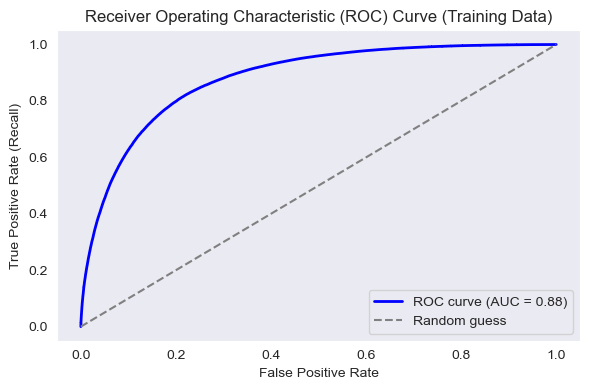


Test Data Evaluation:
Test Accuracy: 0.7981
Recall (Test Data): 0.8067
F2 Score: 0.7981
Classification Report (Test Data):
               precision    recall  f1-score   support

           0       0.80      0.79      0.80     36047
           1       0.79      0.81      0.80     35914

    accuracy                           0.80     71961
   macro avg       0.80      0.80      0.80     71961
weighted avg       0.80      0.80      0.80     71961



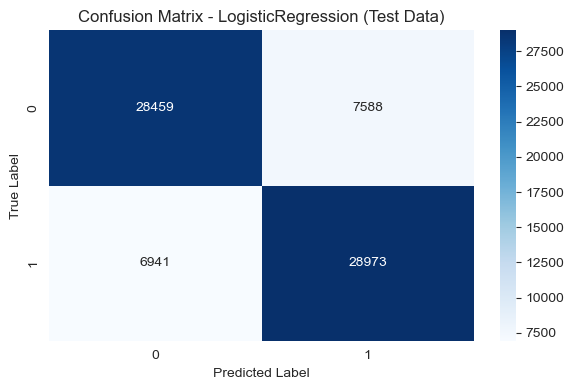

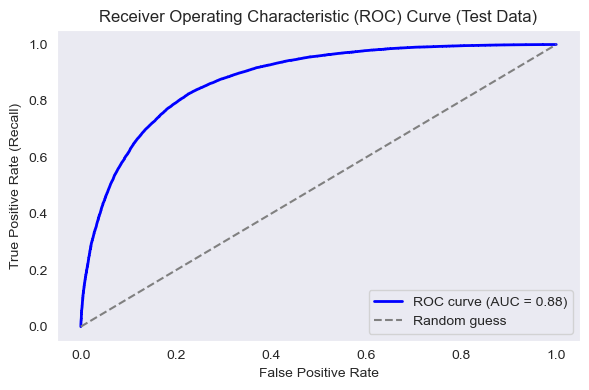

In [228]:
evaluate_model_performance_display(best_model_df,x_train_df,y_train_df,x_test_df, y_test_df)

## RANDOM FOREST

In [270]:
from joblib import parallel_backend

In [272]:
from sklearn.ensemble import RandomForestClassifier
Random=RandomForestClassifier()

In [274]:
parameters={
    'n_estimators':[10,50,100],
    'max_depth':[10, 20, 30],
    'min_samples_split':[2, 5, 10], 
}

In [276]:
random_df=GridSearchCV(estimator=Random,param_grid=parameters,cv=3,verbose=2,n_jobs=-1)

In [278]:
with parallel_backend('multiprocessing'):
  random_df.fit(x_train_df, y_train_df)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


In [283]:
random_df.best_params_

{'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 100}

In [285]:
results=pd.DataFrame(random_df.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,23.334958,0.488081,0.173217,0.030963,10,2,10,"{'max_depth': 10, 'min_samples_split': 2, 'n_e...",0.825166,0.818610,0.812125,0.818634,0.005324,19
1,143.002557,2.925755,0.640763,0.120162,10,2,50,"{'max_depth': 10, 'min_samples_split': 2, 'n_e...",0.818808,0.816484,0.816711,0.817334,0.001046,20
2,305.029740,7.140338,1.259638,0.226858,10,2,100,"{'max_depth': 10, 'min_samples_split': 2, 'n_e...",0.817036,0.812002,0.815669,0.814903,0.002125,22
3,26.714298,0.312624,0.175388,0.032493,10,5,10,"{'max_depth': 10, 'min_samples_split': 5, 'n_e...",0.813222,0.815066,0.812824,0.813704,0.000977,26
4,145.854612,1.899513,0.624801,0.130444,10,5,50,"{'max_depth': 10, 'min_samples_split': 5, 'n_e...",0.820820,0.814545,0.810875,0.815413,0.004106,21
5,302.229142,4.971239,1.452882,0.168602,10,5,100,"{'max_depth': 10, 'min_samples_split': 5, 'n_e...",0.817088,0.818151,0.808957,0.814732,0.004107,23
6,28.960564,0.263894,0.193412,0.035155,10,10,10,"{'max_depth': 10, 'min_samples_split': 10, 'n_...",0.815765,0.813274,0.812042,0.813694,0.001549,27
7,152.747637,0.671922,0.635560,0.144300,10,10,50,"{'max_depth': 10, 'min_samples_split': 10, 'n_...",0.816046,0.814556,0.812230,0.814277,0.001570,24
8,305.634707,8.018990,1.407172,0.251280,10,10,100,"{'max_depth': 10, 'min_samples_split': 10, 'n_...",0.818808,0.811502,0.810989,0.813767,0.003571,25
9,49.272593,0.991641,0.284798,0.047911,20,2,10,"{'max_depth': 20, 'min_samples_split': 2, 'n_e...",0.859007,0.861456,0.850522,0.856995,0.004685,16


In [287]:
random_df.best_score_

0.897204368454005

In [291]:
best_par_forest=random_df.best_estimator_
best_par_forest

RandomForestClassifier(max_depth=30)

#### Model Performance

Model: RandomForestClassifier

Training Data Evaluation:
Training Accuracy: 0.9939


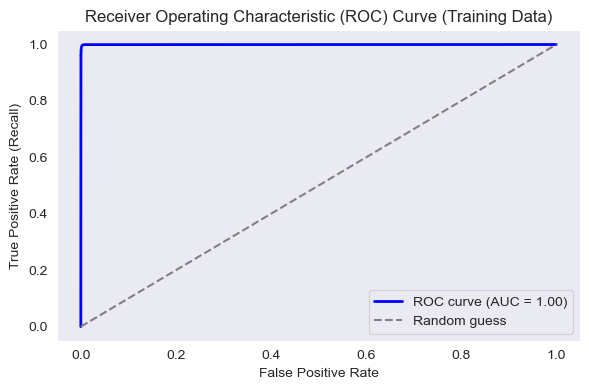


Test Data Evaluation:
Test Accuracy: 0.9082
Recall (Test Data): 0.9412
F2 Score: 0.9080
Classification Report (Test Data):
               precision    recall  f1-score   support

           0       0.94      0.88      0.91     36047
           1       0.88      0.94      0.91     35914

    accuracy                           0.91     71961
   macro avg       0.91      0.91      0.91     71961
weighted avg       0.91      0.91      0.91     71961



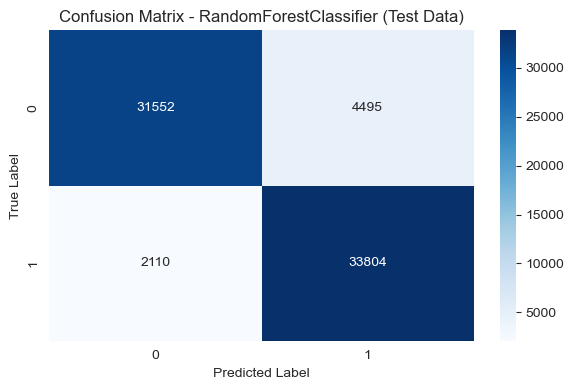

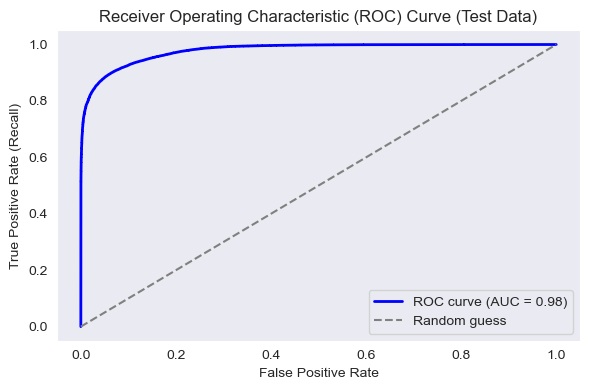

In [295]:
evaluate_model_performance_display(best_par_forest,x_train_df,y_train_df,x_test_df, y_test_df)

### XGBoosting

In [238]:
import xgboost as xgb
from scipy.stats import uniform

xgb_model = xgb.XGBClassifier(eval_metric='mlogloss')


In [244]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier


xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
param_grid = {
    'n_estimators': [100, 200],              
    'learning_rate': [0.01, 0.1],              
    'max_depth': [5, 7],                       
    'subsample': [0.7, 0.8],                 
    'colsample_bytree': [0.7, 0.8],           
    'gamma': [0, 0.1],                        
    'min_child_weight': [3, 5]                 
}

grid_search = RandomizedSearchCV(estimator=xgb_model, 
                           param_distributions=param_grid, 
                           scoring='accuracy', 
                           cv=3, 
                           verbose=2, 
                           n_jobs=-1)

In [246]:
with parallel_backend('multiprocessing'):
  grid_search.fit(x_train_df, y_train_df)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


In [249]:
results=pd.DataFrame(grid_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_min_child_weight,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,6.472123,1.117719,0.113631,0.004682,0.7,100,5,5,0.10,0.0,0.7,"{'subsample': 0.7, 'n_estimators': 100, 'min_c...",0.857089,0.855046,0.852919,0.855018,0.001703,7
1,17.271589,1.857248,0.142738,0.018914,0.7,100,3,7,0.10,0.1,0.7,"{'subsample': 0.7, 'n_estimators': 100, 'min_c...",0.872744,0.873588,0.871346,0.872559,0.000925,3
2,45.486464,2.815813,0.151829,0.011271,0.7,200,5,5,0.01,0.0,0.7,"{'subsample': 0.7, 'n_estimators': 200, 'min_c...",0.816025,0.813920,0.810062,0.813336,0.002469,10
3,67.582921,0.122074,0.135323,0.014796,0.7,200,3,7,0.01,0.1,0.8,"{'subsample': 0.7, 'n_estimators': 200, 'min_c...",0.826437,0.825499,0.820526,0.824154,0.002594,8
4,65.886884,0.907362,0.120502,0.012297,0.7,200,5,7,0.01,0.0,0.8,"{'subsample': 0.7, 'n_estimators': 200, 'min_c...",0.826437,0.825103,0.820578,0.824039,0.002507,9
5,41.002339,0.243404,0.154035,0.014222,0.7,100,3,7,0.10,0.0,0.8,"{'subsample': 0.7, 'n_estimators': 100, 'min_c...",0.872264,0.873702,0.871096,0.872354,0.001066,4
6,53.028032,0.778741,0.123818,0.001709,0.7,200,3,5,0.10,0.1,0.8,"{'subsample': 0.7, 'n_estimators': 200, 'min_c...",0.875360,0.876173,0.874118,0.875217,0.000845,1
7,32.144432,0.223654,0.145359,0.015807,0.7,100,5,5,0.10,0.1,0.8,"{'subsample': 0.7, 'n_estimators': 100, 'min_c...",0.856047,0.856902,0.852158,0.855036,0.002064,6
8,44.715189,1.498315,0.092994,0.015485,0.8,200,3,5,0.10,0.0,0.7,"{'subsample': 0.8, 'n_estimators': 200, 'min_c...",0.875651,0.876318,0.873441,0.875137,0.001230,2
9,36.180005,0.020774,0.091899,0.017297,0.7,100,5,7,0.10,0.0,0.8,"{'subsample': 0.7, 'n_estimators': 100, 'min_c...",0.872410,0.873160,0.869730,0.871767,0.001472,5


In [251]:
best_param=grid_search.best_estimator_
best_param

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=0.1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=3, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

#### Model Performane

Model: XGBClassifier

Training Data Evaluation:
Training Accuracy: 0.8886


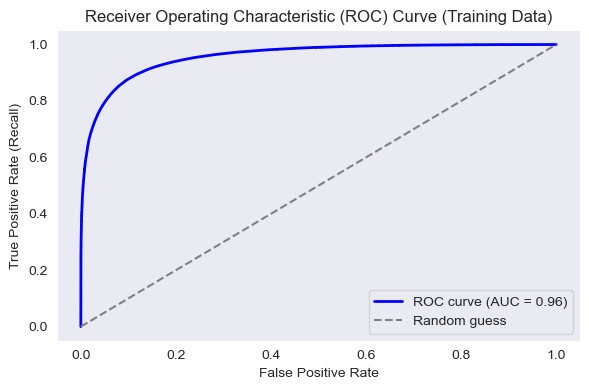


Test Data Evaluation:
Test Accuracy: 0.8747
Recall (Test Data): 0.8775
F2 Score: 0.8747
Classification Report (Test Data):
               precision    recall  f1-score   support

           0       0.88      0.87      0.87     36047
           1       0.87      0.88      0.87     35914

    accuracy                           0.87     71961
   macro avg       0.87      0.87      0.87     71961
weighted avg       0.87      0.87      0.87     71961



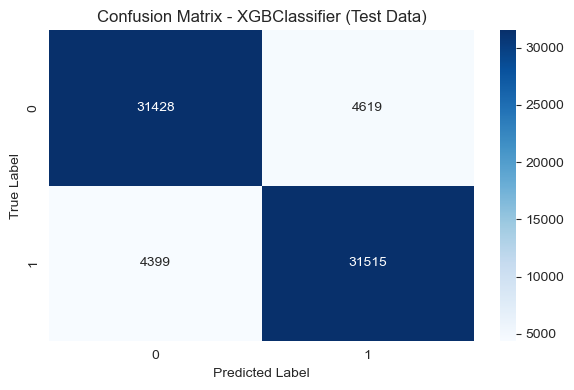

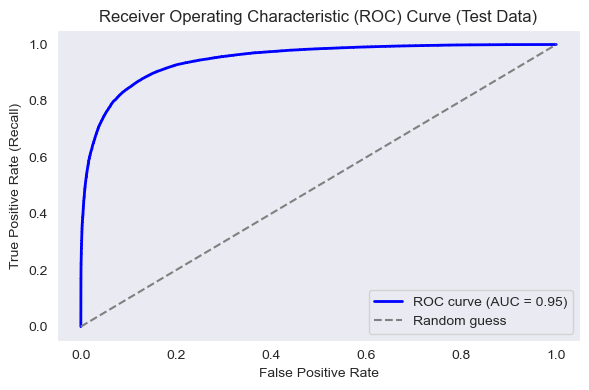

In [254]:
evaluate_model_performance_display(best_param,x_train_df,y_train_df,x_test_df, y_test_df)

### Light BGM

In [257]:
import lightgbm as lgb
light_model=lgb.LGBMClassifier(verbose=-1)
param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [ 0.1, 0.2],
    'max_depth': [ 5, 7],
    'num_leaves': [31, 50, 100],
    'subsample': [ 0.7, 0.8],
    'colsample_bytree': [0.7, 0.8]
}


In [259]:
lg1=GridSearchCV(estimator=light_model,param_grid=param_grid,n_jobs=-1,scoring='accuracy',cv=3)

In [261]:
with parallel_backend('multiprocessing'):
  lg1.fit(x_train_df, y_train_df)

In [263]:
res=pd.DataFrame(lg1.cv_results_)
res[res['rank_test_score']==1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
94,19.998422,0.925299,0.064603,0.008252,0.8,0.2,7,100,100,0.7,"{'colsample_bytree': 0.8, 'learning_rate': 0.2...",0.892775,0.893348,0.89119,0.892438,0.000913,1
95,18.391909,0.444465,0.069912,0.004650,0.8,0.2,7,100,100,0.8,"{'colsample_bytree': 0.8, 'learning_rate': 0.2...",0.892775,0.893348,0.89119,0.892438,0.000913,1


In [265]:
best_param_1=lg1.best_estimator_
best_param_1

LGBMClassifier(colsample_bytree=0.8, learning_rate=0.2, max_depth=7,
               num_leaves=100, subsample=0.7, verbose=-1)

#### Model Performance

Model: LGBMClassifier

Training Data Evaluation:
Training Accuracy: 0.9285


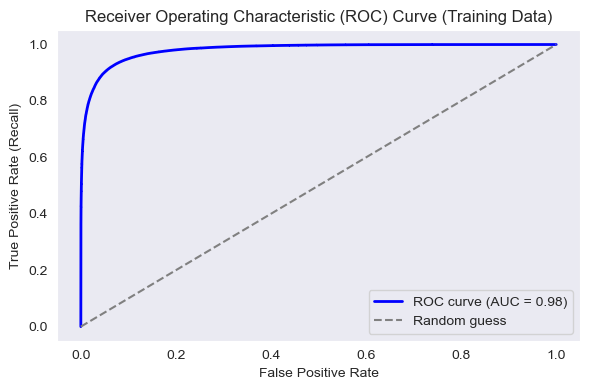


Test Data Evaluation:
Test Accuracy: 0.8946
Recall (Test Data): 0.8993
F2 Score: 0.8946
Classification Report (Test Data):
               precision    recall  f1-score   support

           0       0.90      0.89      0.89     36047
           1       0.89      0.90      0.89     35914

    accuracy                           0.89     71961
   macro avg       0.89      0.89      0.89     71961
weighted avg       0.89      0.89      0.89     71961



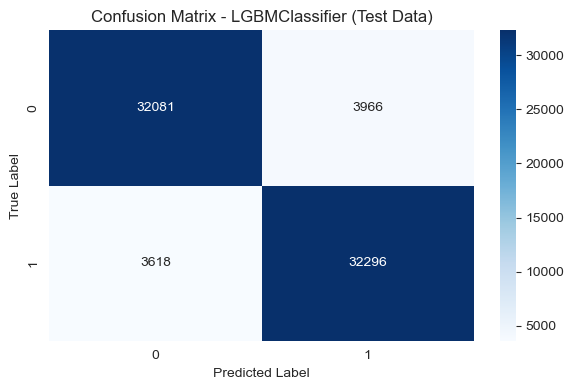

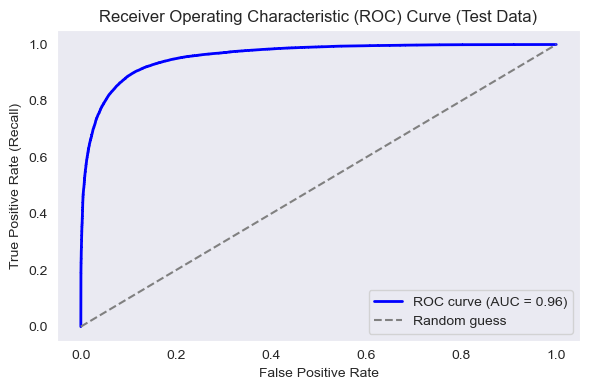

In [268]:
evaluate_model_performance_display(best_param_1,x_train_df,y_train_df,x_test_df, y_test_df)

## Model Comparision

This Function is used to print the model comparision dataframe

In [297]:
def create_model_performance(models, x_train_df, y_train_df, x_test_df, y_test_df):
    all_model_results = []


    for model, model_name in models:
       
        model_results = evaluate_model_performance(model, x_train_df, y_train_df, x_test_df, y_test_df, show_plots=False)

        train_accuracy = model_results["Train Accuracy"]
        test_accuracy = model_results["Test Accuracy"]
        train_auc = model_results["AUC (Train)"]
        test_auc = model_results["AUC (Test)"]
       
    
        all_model_results.append({
            "Model Name": model_name,
            "Train Accuracy": train_accuracy,
            "Test Accuracy": test_accuracy,
            "Train AUC": train_auc,
            "Test AUC": test_auc
        })
        

    model_performance_df = pd.DataFrame(all_model_results)
    return model_performance_df


In [299]:

models = [
    (best_model_df, "Logistic Regression"),
    (best_par_forest, "Random Forest"),
    (best_param, "XGBoost"),
    (best_param_1, "LightGBM")
]

model_performance_dataframe = create_model_performance(models, x_train_df, y_train_df, x_test_df, y_test_df)

In [301]:
model_performance_dataframe

,Model Name,Train Accuracy,Test Accuracy,Train AUC,Test AUC
0,Logistic Regression,0.800113,0.798099,0.878732,0.877221
1,Random Forest,0.993903,0.908214,0.999946,0.978675
2,XGBoost,0.888596,0.874682,0.957516,0.946913
3,LightGBM,0.928513,0.894610,0.981189,0.959424


# Project Submission: Machine Learning Model Evaluation for Customer Transaction Prediction

**Objective:** The goal of this project is to predict whether a customer will perform a transaction based on their features. 

**Models Evaluated:**
1.   Logistic Regression (LR)
2.   Random Forest Classifier (RFC)
3.   XGBoost Classifier
4.   Light Gradient Boosting Machine (LGBM)


**Analysis:**
*   Among all models, ***Light Gradient Boosting Machine (LGBM) and XGBoost Classifier achieved the highest accuracy***
*   Both models demonstrate superior performance, outperforming others in handling the complexity of the dataset.
*   Logistic Regression  had the lowest accuracies, indicating they are less suited for this problem.
*   Random Forest has higherst accuarcy but the reason we didn't  choose as best model because of  high gap between training and testing accuracy

**Conclusion:**

Based on the accuracy metric:

*   Light Gradient Boosting Machine (LGBM) and XGBoost Classifier are equally effective for the Customer Transaction Prediction
*   Both models are recommended for deployment, considering their high accuracy and efficiency.


# Project Challenges:
**Challenges Faced and Techniques Used**


**1. Handling Outliers**

**Challenge:**

- Outliers in numerical features could distort the model and lead to overfitting or inaccurate predictions.

**Solution**:

- Winsorization was used to handle outliers.

- The extreme values were capped at a specified percentile (e.g., 5th and 95th percentiles), ensuring that outliers did not disproportionately affect the model’s performance.

**Reason for Technique**:

- Winsorization preserves the structure of the data while controlling for the impact of extreme values. It is particularly useful when outliers are genuine data points but need to be contained for modeling.

**2. High Dimensionality**

**Challenge:**

- The dataset contained a large number of features, leading to potential overfitting.

**Solution:**

- Principal Component Analysis (PCA) was applied to reduce dimensionality.

- PCA transformed the feature space into a lower-dimensional space, capturing the most variance while reducing redundant information.

**Reason for Technique:**

- PCA helps improve computational efficiency and reduces the risk of overfitting by retaining only the most important components.

**3.Finding Optimal Hyperparameters**

**Challenge:**

- Determining the best hyperparameters for the machine learning model to maximize predictive accuracy.

**Solution:**

- Both Grid Search with Cross-Validation (Grid Search CV) and RandomizedSearchCV were implemented.

- Grid Search CV exhaustively searched over specified parameter values while using cross-validation to evaluate performance.

- RandomizedSearchCV sampled a fixed number of parameter settings from the specified distributions, allowing faster exploration of hyperparameters.

**Reason for Technique:**

- Grid Search CV ensures that the best combination of hyperparameters is selected by systematically exploring all possibilities and validating them on unseen folds of the data
- RandomizedSearchCV complements this by providing a quicker search alternative, especially useful when the parameter space is large.